# Quantifying semisc similarity
## Chapter X: Data sequence analysis

### Author: Anders Kampenes

### Dimension reduction and visualization with PCA

In [ ]:
### Loading and preparing dataset

In [1]:
%matplotlib inline
import os
import numpy as np
import matplotlib.pylab as plt 
from sklearn.datasets import load_digits 
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline



# Path hack.
import sys, os
sys.path.insert(0, os.path.abspath('..'))
from scripts.data_utils.plots import scatter, visualize_scatter_with_images, plot_random_directions, plot_subset_of_directions 
from scripts.data_utils.generators import  generate_directional_dataset, flatten_directional_data

#load  seimsic data
chapterName = "02-data_sequence_analysis"
output_folder = "/Users/anderskampenes/Documents/Dokumenter/NTNU/MASTER/code/notebooks/" + chapterName
data_cube = np.load("/Users/anderskampenes/Documents/Dokumenter/NTNU/MASTER/code/data/processed/f3_entire_int8.npy")

print("img shape", data_cube.shape)

directions, inline_samples, xline_samples, tline_samples,data, labels, num_samples, shape = generate_directional_dataset(data_cube)


#print("labels", labels["inline"], labels["xline"], labels["tline"])


/usr/local/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:519: FutureWarning: Passing (type, 1) or 

img shape (651, 951, 462)
651 951 462


48


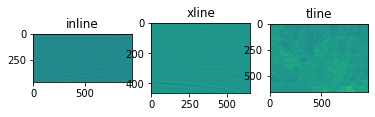

In [2]:

plot_random_directions(data, 100)
   

In [4]:
"""
We see that inline and xline directions have clear stacking patterns, 
but the tline is more meshy.

Intuitivly, we would could easily see more clear pattern change in iline/xline direction 
"""

'\nWe see that inline and xline directions have clear stacking patterns, \nbut the tline is more meshy.\n\nIntuitivly, we would could easily see more clear pattern change in iline/xline direction \n'

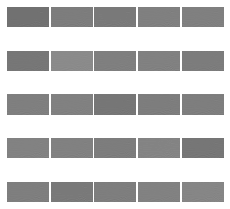

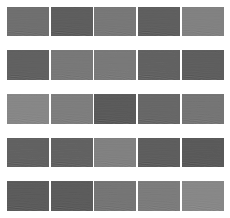

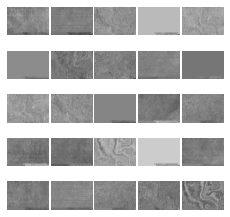

In [3]:
# plot supsets of each direction to visualize patterns in each direction
plot_subset_of_directions(data, directions, 100)

In [ ]:
"""
When looking at macroscopic patterns, we see that all do contain such patterns

"""

In [7]:
### Dimension reduction and visualization with PCA

In [5]:
from sklearn.cluster import KMeans
# flatten directions 
data = flatten_directional_data(data, num_samples)
print("flattten dirs", data["inline"].shape, data["xline"].shape, data["tline"].shape )

# perform PCA for each dir 

pca = {}

for dir in directions:
    filename = output_folder + "/pca_" + dir + ".npy"
    if not os.path.exists(filename):
        print("did not find data.. creating new...")
        print("dir", dir, data[dir].shape, len(labels[dir]), num_samples[dir])
        pca_digits=PCA(2)
        pca[dir] = pca_digits.fit_transform(data[dir]) 
        print(np.sum(pca_digits.explained_variance_ratio_))
        # store the data 
        np.save(filename, pca[dir])
    else:
        print("found data. loading it to memory")
        pca[dir] = np.load(filename)

flattten dirs (651, 439362) (951, 300762) (462, 619101)
found data. loading it to memory
found data. loading it to memory
found data. loading it to memory


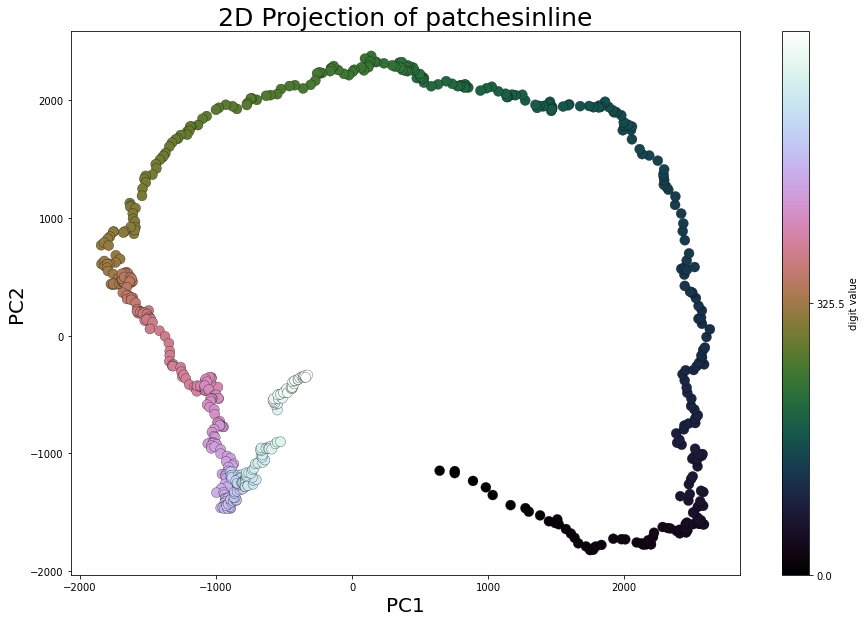

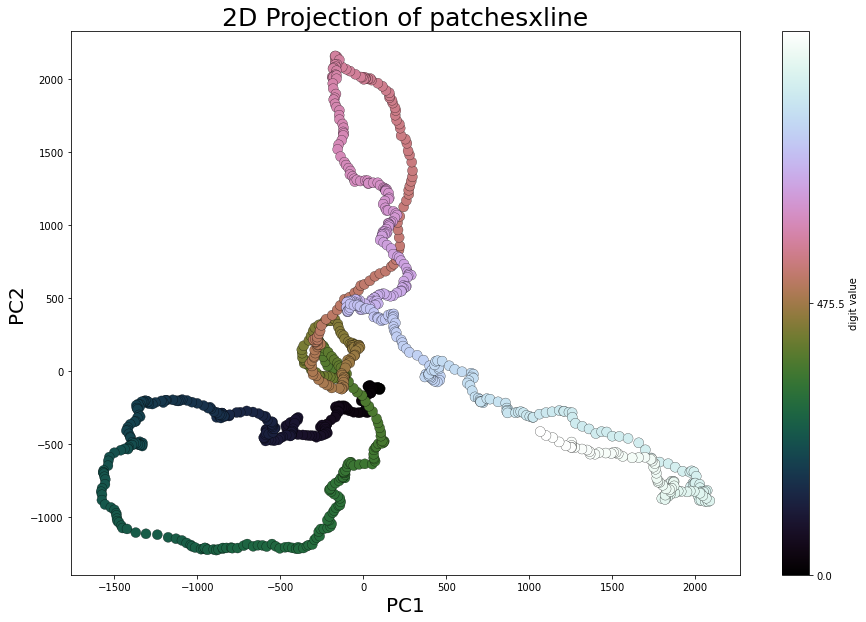

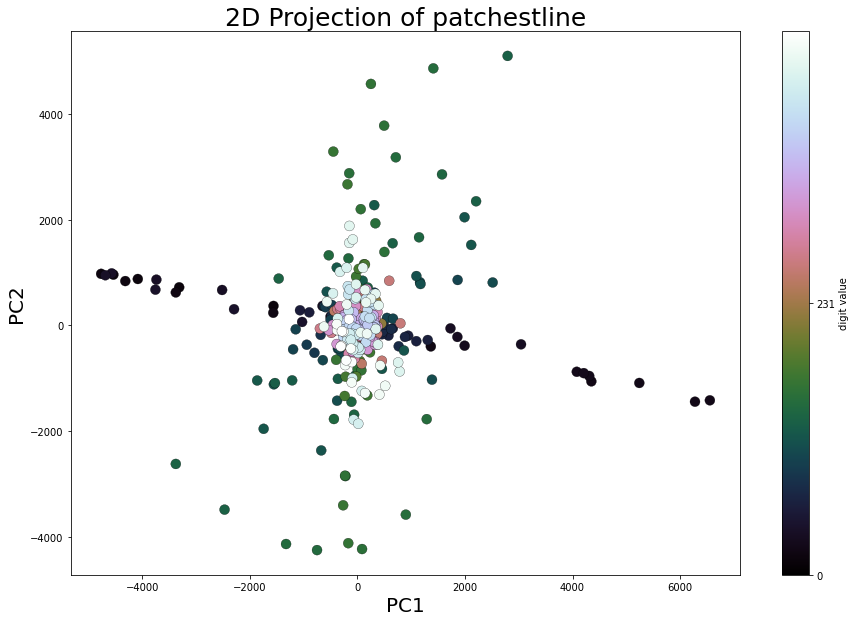

In [6]:
# scatter the different images with the original label     
for dir in directions:
    scatter(pca[dir], labels[dir], num_samples[dir], dir, output=output_folder +"/pca_"+dir+".png", show_labels=False)
    

pca[dir] (651, 2)
pca[dir] (951, 2)
pca[dir] (462, 2)


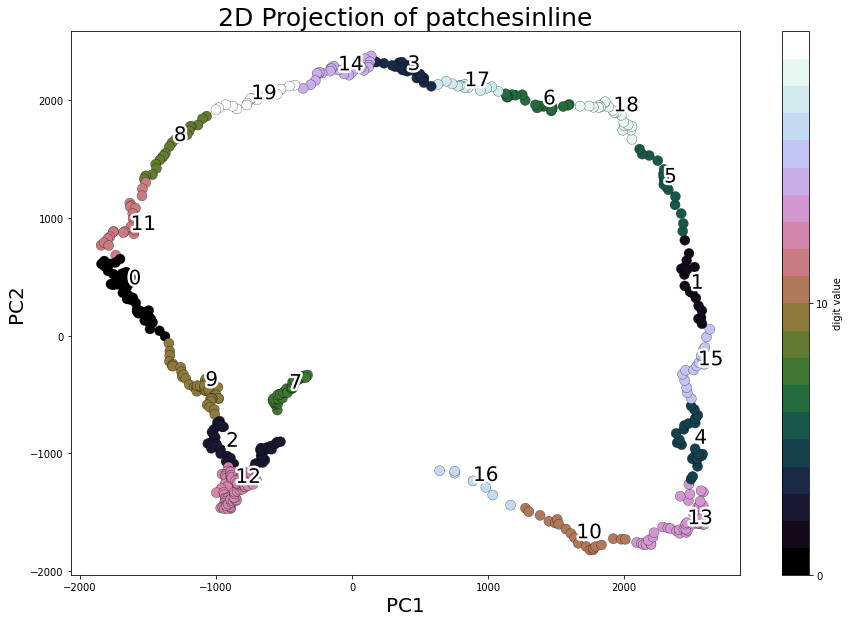

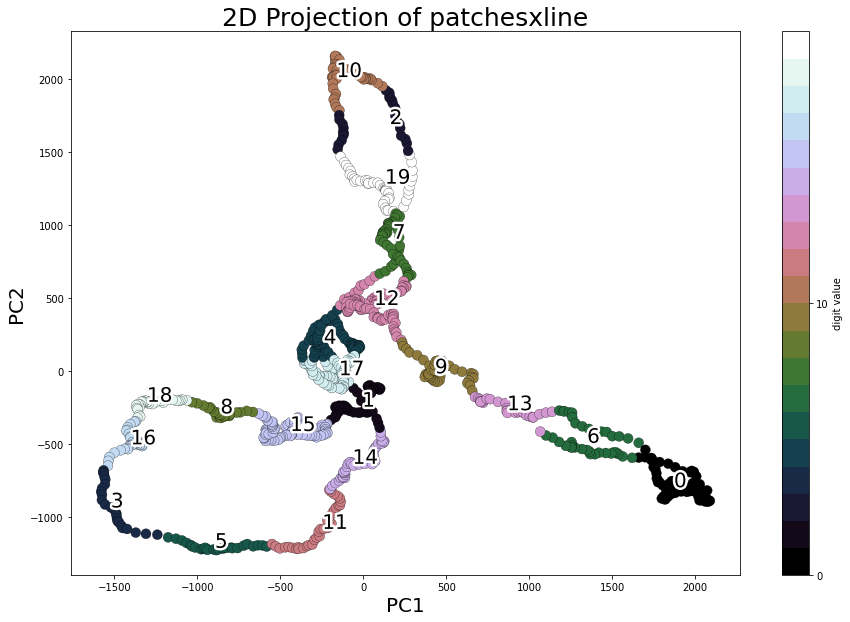

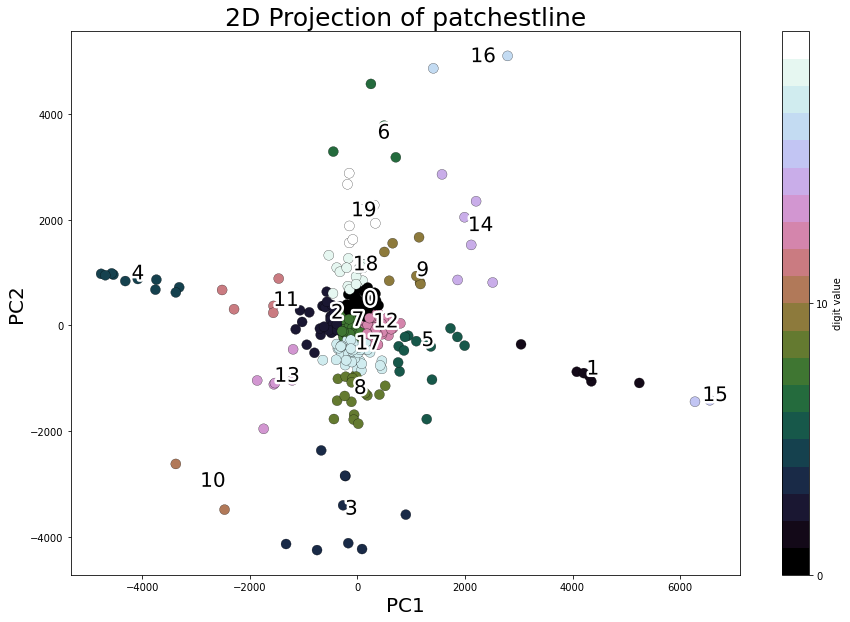

In [9]:
# perform k-means on each dir  to seperate into clusters?
n_clusters = 20

for dir in directions:
    print("pca[dir]", pca[dir].shape)
    k_means = KMeans(n_clusters, random_state=0)
    k_means.fit(pca[dir])
    values = k_means.cluster_centers_.squeeze()
    labels_kmeans = k_means.labels_

    # plot 
    scatter(pca[dir], labels_kmeans, n_clusters, dir, output=output_folder +"/pca_kmeans_"+dir+"_"+str(n_clusters)+".png", show_labels=True)

In [ ]:
"""
When using pca to ptoject the data into 2D space, we see that 
every image is most similar to the next. This is evident in inline/xline, 
and is expected as we consider the directions to be continuous changing. The tline direction is a result 
of changes in bot iline and xline ansd is less linear. Among xline/inline
xline seem to have more distinc area in som e parts of the survye, and come reoccuring 
characterisitcts, indicated by the "lines" beeing almost as close to other indexes than the next in some parts of
the survey.

one could use this projection to estimate which slices is more similar by using eucledian distance 
from the projected points. 

TODO: TAKE A IMAGE AND FIND AND PLOT THE IMAGES THAT IS CLOSE TO SAID THAT SLICE BUT NOT CLOSE IN INDEX
"""

(951, 2)
Plottting:  inline
Plottting:  xline
Plottting:  tline


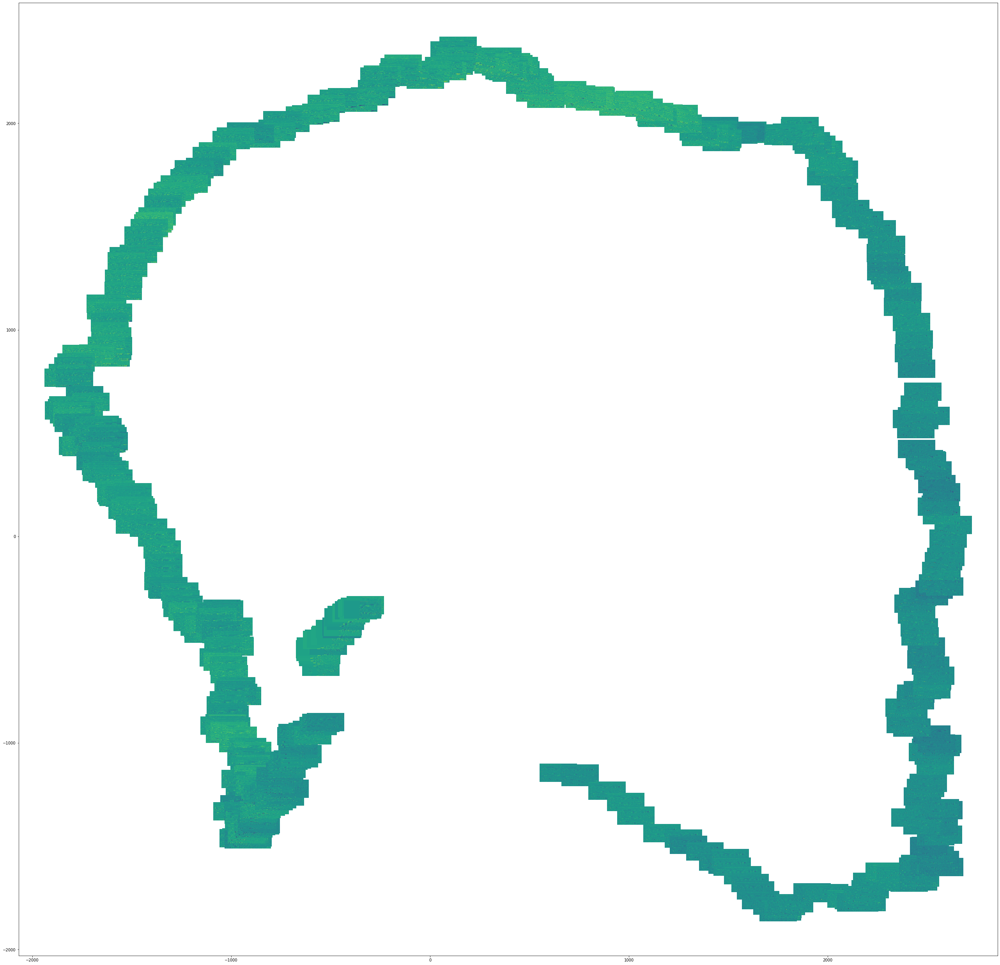

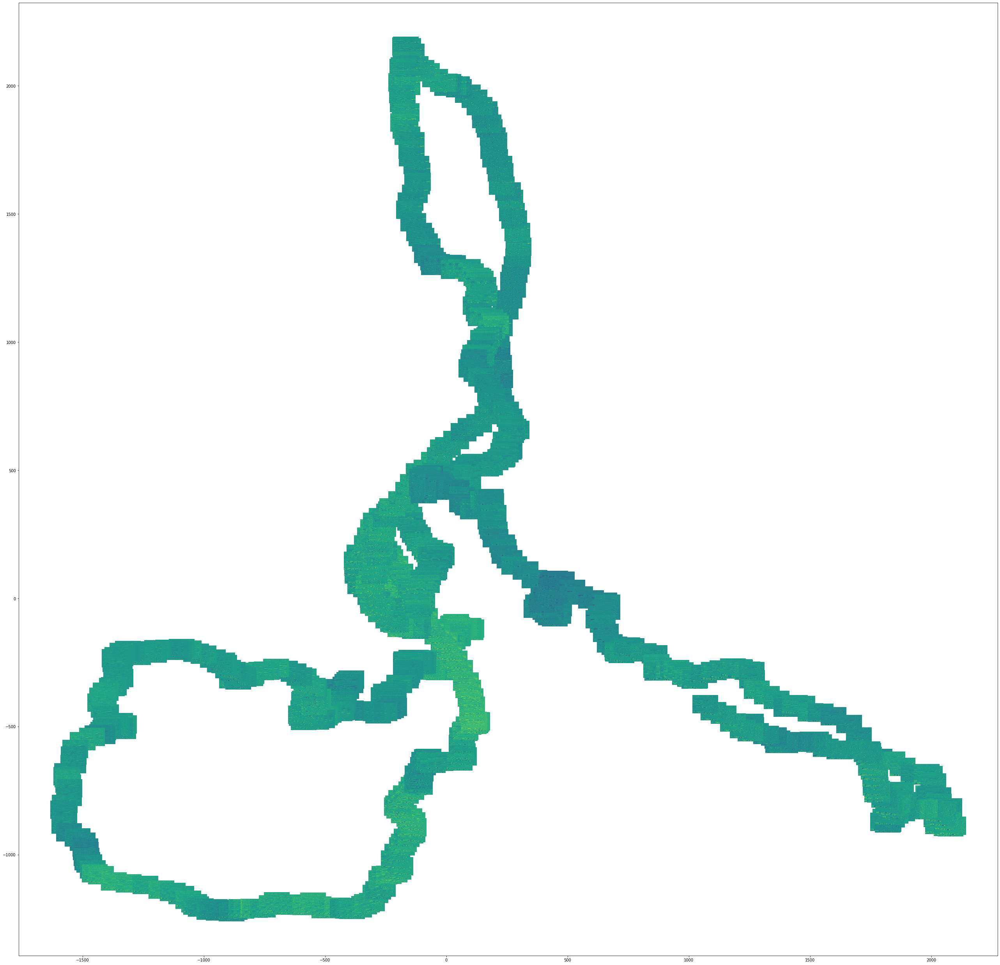

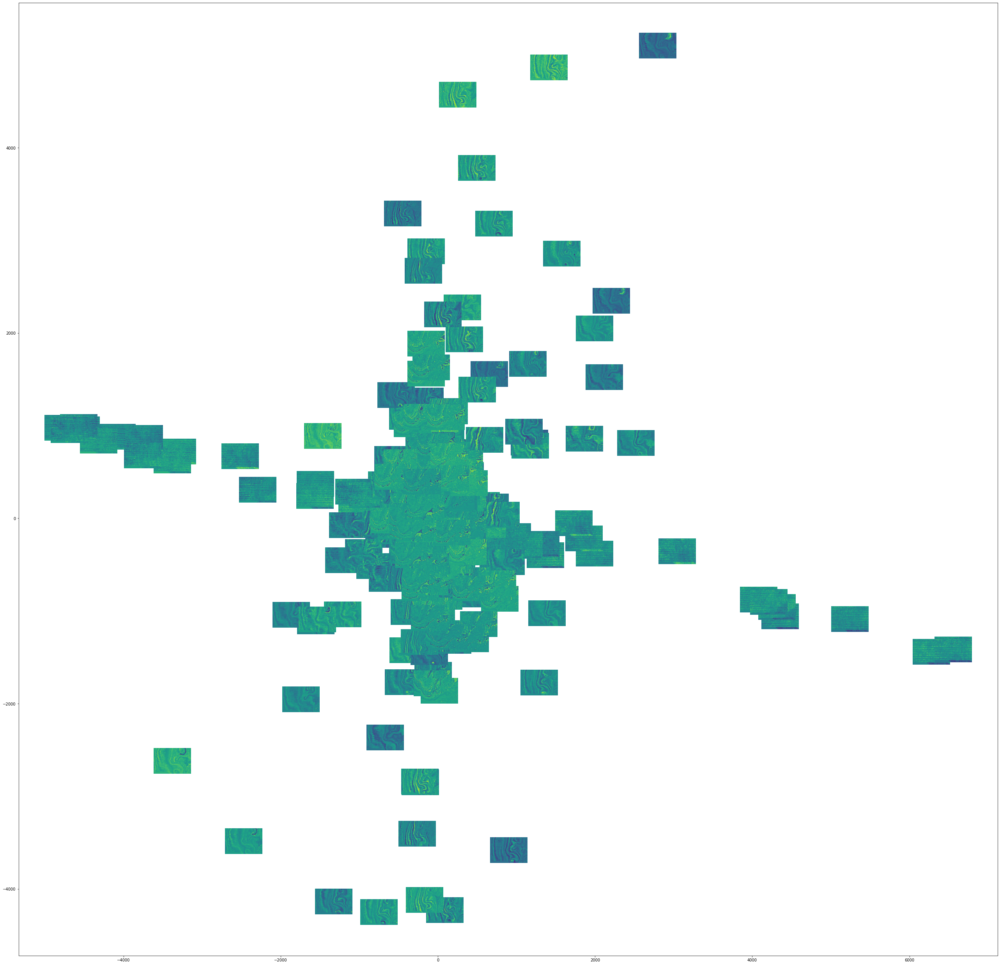

In [11]:
# visualise the scatterplot in actual images 

for dir in directions:
    print("Plottting: ", dir)
    images = data[dir]
    plots = pca[dir]
    dims = shape[dir]
    filename = output_folder + "/pca_sliceplot_" + dir + ".png"
    visualize_scatter_with_images(plots, images = [np.reshape(i, (dims[0],dims[1])).T for i in images], image_zoom=0.1, output=filename)

In [ ]:
### Dimension reduction and visualization with TSNE


In [3]:
from sklearn.metrics.pairwise import pairwise_distances
from sklearn.manifold import TSNE
from sklearn.manifold.t_sne import (_joint_probabilities,
                                    _kl_divergence)


# Random state we define this random state to use this value in TSNE which is a randmized algo.
RS = 25111993
T_SNE ={}
for dir in directions:
    filename = output_folder + "/T_SNE_" + dir + ".npy"
    if not os.path.exists(filename):
        print("did not find data.. creating new...")
        print("dir", dir, data[dir].shape, len(labels[dir]), num_samples[dir])
        T_SNE[dir] = TSNE(random_state=RS).fit_transform(data[dir])
        # store the data 
        np.save(filename, T_SNE[dir])
    else:
        print("found data. loading it to memory")
        T_SNE[dir] = np.load(filename)

found data. loading it to memory
found data. loading it to memory
found data. loading it to memory


/usr/local/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.manifold.t_sne module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.manifold. Anything that cannot be imported from sklearn.manifold is now part of the private API.
  warnings.warn(message, FutureWarning)


In [4]:
# perform k-means on each dir  to seperate into clusters?
n_clusters = 20

for dir in directions:
    print("T_SNE[dir]", T_SNE[dir].shape)
    k_means = KMeans(n_clusters, random_state=0)
    k_means.fit(T_SNE[dir])
    values = k_means.cluster_centers_.squeeze()
    labels_kmeans = k_means.labels_

    # plot 
    scatter(T_SNE[dir], labels_kmeans, n_clusters, dir, output=output_folder +"/TSNE_kmeans_"+dir+"_"+str(n_clusters)+".png", show_labels=True)

pca[dir] (651, 2)
pca[dir] (951, 2)
pca[dir] (462, 2)


Plottting:  inline
Plottting:  xline
Plottting:  tline


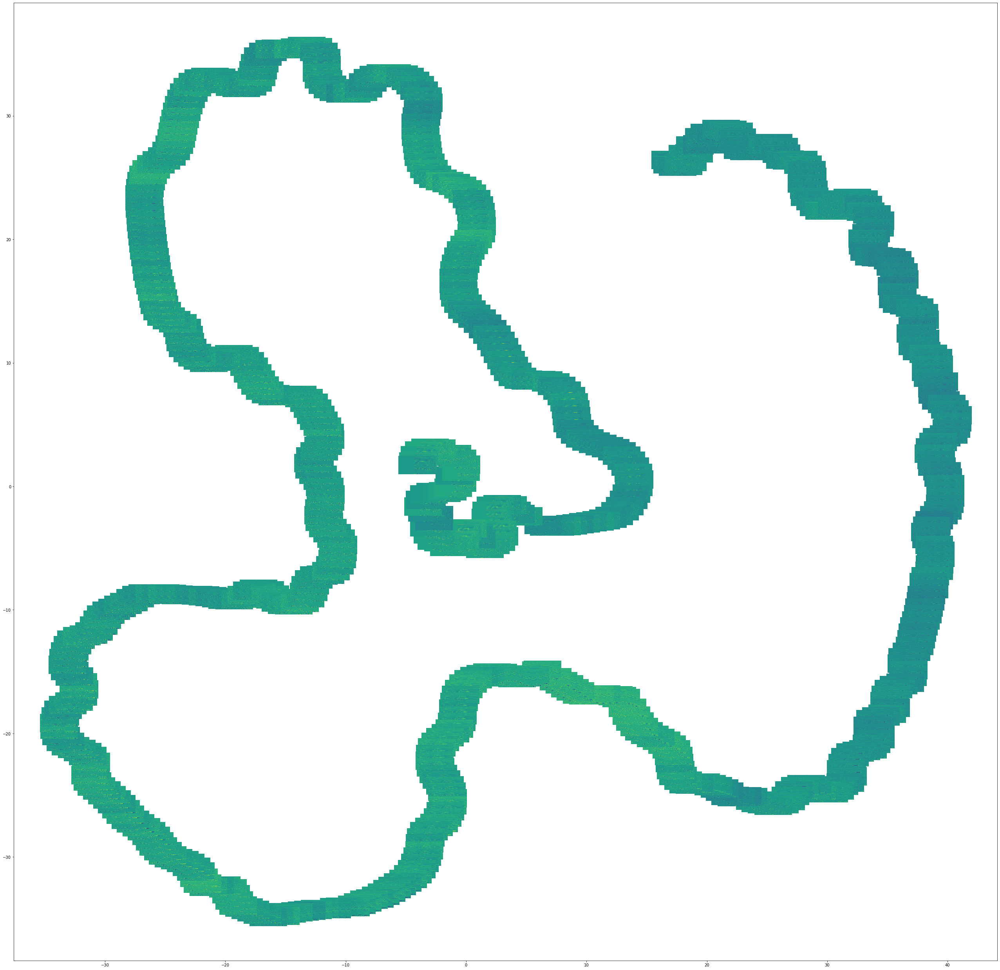

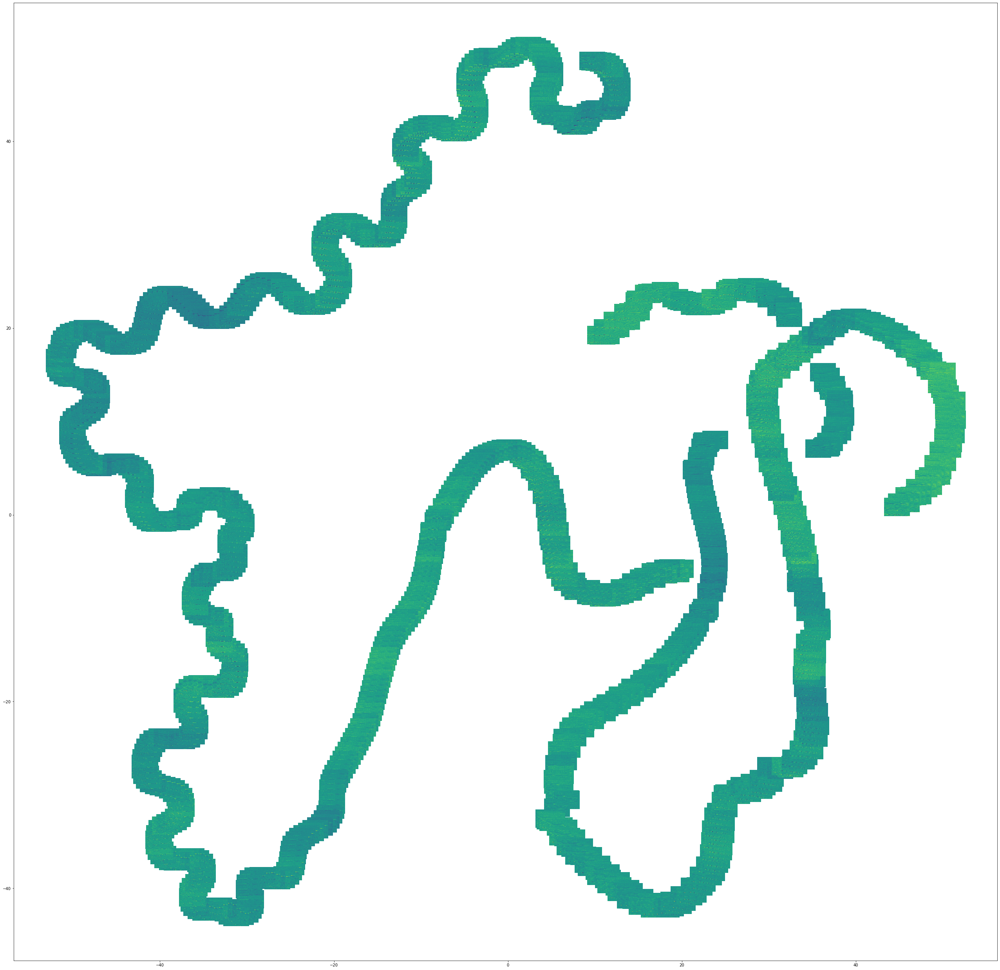

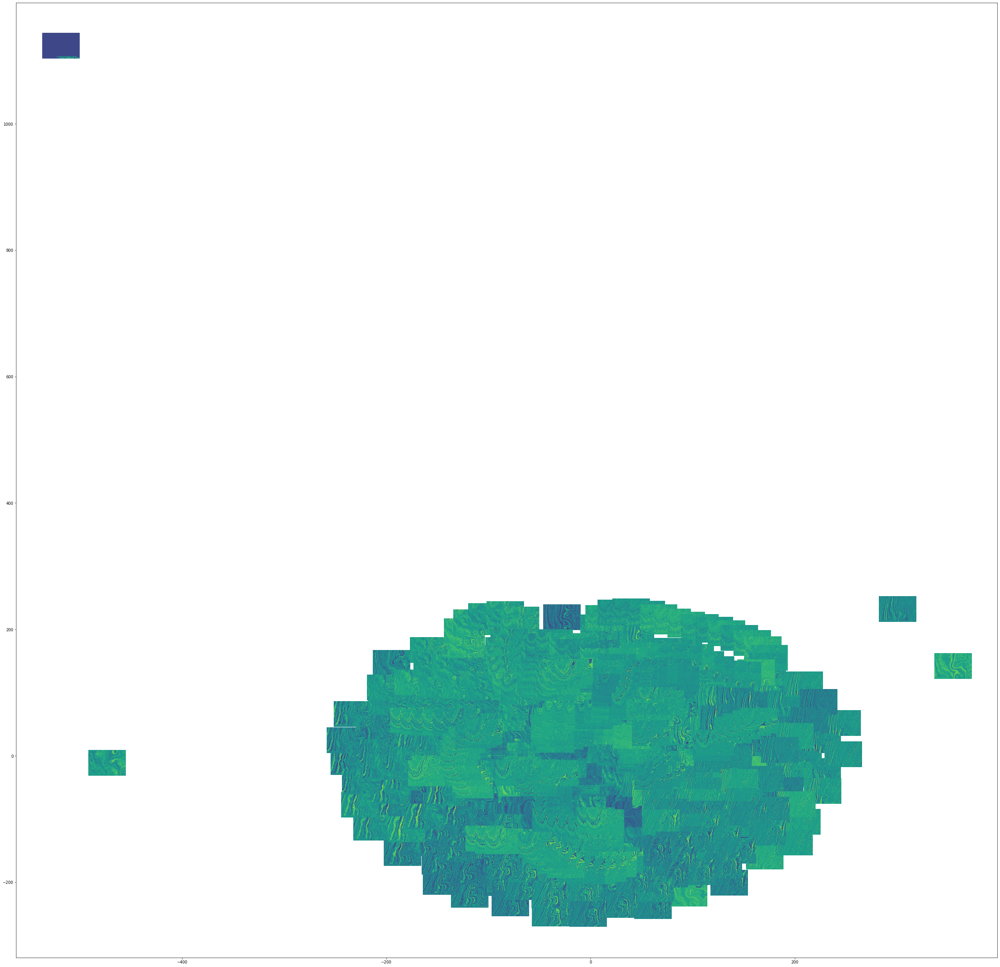

In [35]:
# visualise the scatterplot in actual images 

for dir in directions:
    print("Plottting: ", dir)
    images = data[dir]
    plots = T_SNE[dir]
    dims = shape[dir]
    filename = output_folder + "/TSNE_sliceplot_" + dir + ".png"
    visualize_scatter_with_images(plots, images = [np.reshape(i, (dims[0],dims[1])).T for i in images], image_zoom=0.1, output=filename)

In [ ]:
### TRY KNN AND OTHER CLUSTERING THAN KMEANS TO EXPLOIT EUCLEDIAN DISTANCE IN PROJECTION SPACE 
### use a clustering algorithm that infers number of clusters. Kmeans splits unintuitvily becouse of the num_clusters are foreced to apply

In [ ]:
## do this process for induvidual patches and not only actual images

In [ ]:
### 5TSNE WITH PCA
